In [1]:
import numpy as np
import pandas as pd 
import os


In [2]:
import tensorflow as tf
import json
# import hdf5
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import cv2


from matplotlib import patches, patheffects
from collections import defaultdict
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from pathlib import Path

In [39]:
from keras.models import Model
import cv2
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.layers import Activation
from pylab import *
import keras

In [3]:
path = Path('PASCAL_VOC/')
img_path = Path('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages')
anno_path = path / 'PASCAL_VOC'

img_path1 = Path('VOCtest_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages')

In [4]:
train = json.load((anno_path/'pascal_train2007.json').open())
train.keys()
val = json.load((anno_path/'pascal_val2007.json').open())
val.keys()
test = json.load((anno_path/'pascal_test2007.json').open())

In [5]:
train['images']

[{'file_name': '000012.jpg', 'height': 333, 'width': 500, 'id': 12},
 {'file_name': '000017.jpg', 'height': 364, 'width': 480, 'id': 17},
 {'file_name': '000023.jpg', 'height': 500, 'width': 334, 'id': 23},
 {'file_name': '000026.jpg', 'height': 333, 'width': 500, 'id': 26},
 {'file_name': '000032.jpg', 'height': 281, 'width': 500, 'id': 32},
 {'file_name': '000033.jpg', 'height': 366, 'width': 500, 'id': 33},
 {'file_name': '000034.jpg', 'height': 500, 'width': 360, 'id': 34},
 {'file_name': '000035.jpg', 'height': 375, 'width': 500, 'id': 35},
 {'file_name': '000036.jpg', 'height': 500, 'width': 332, 'id': 36},
 {'file_name': '000042.jpg', 'height': 335, 'width': 500, 'id': 42},
 {'file_name': '000044.jpg', 'height': 333, 'width': 500, 'id': 44},
 {'file_name': '000047.jpg', 'height': 333, 'width': 500, 'id': 47},
 {'file_name': '000048.jpg', 'height': 500, 'width': 375, 'id': 48},
 {'file_name': '000061.jpg', 'height': 333, 'width': 500, 'id': 61},
 {'file_name': '000064.jpg', 'heig

In [6]:
train['annotations'][:5]

[{'segmentation': [[155, 96, 155, 270, 351, 270, 351, 96]],
  'area': 34104,
  'iscrowd': 0,
  'image_id': 12,
  'bbox': [155, 96, 196, 174],
  'category_id': 7,
  'id': 1,
  'ignore': 0},
 {'segmentation': [[184, 61, 184, 199, 279, 199, 279, 61]],
  'area': 13110,
  'iscrowd': 0,
  'image_id': 17,
  'bbox': [184, 61, 95, 138],
  'category_id': 15,
  'id': 2,
  'ignore': 0},
 {'segmentation': [[89, 77, 89, 336, 403, 336, 403, 77]],
  'area': 81326,
  'iscrowd': 0,
  'image_id': 17,
  'bbox': [89, 77, 314, 259],
  'category_id': 13,
  'id': 3,
  'ignore': 0},
 {'segmentation': [[8, 229, 8, 500, 245, 500, 245, 229]],
  'area': 64227,
  'iscrowd': 0,
  'image_id': 23,
  'bbox': [8, 229, 237, 271],
  'category_id': 2,
  'id': 4,
  'ignore': 0},
 {'segmentation': [[229, 219, 229, 500, 334, 500, 334, 219]],
  'area': 29505,
  'iscrowd': 0,
  'image_id': 23,
  'bbox': [229, 219, 105, 281],
  'category_id': 2,
  'id': 5,
  'ignore': 0}]

In [7]:
# train['categories']
test['categories']

[{'supercategory': 'none', 'id': 1, 'name': 'aeroplane'},
 {'supercategory': 'none', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'none', 'id': 3, 'name': 'bird'},
 {'supercategory': 'none', 'id': 4, 'name': 'boat'},
 {'supercategory': 'none', 'id': 5, 'name': 'bottle'},
 {'supercategory': 'none', 'id': 6, 'name': 'bus'},
 {'supercategory': 'none', 'id': 7, 'name': 'car'},
 {'supercategory': 'none', 'id': 8, 'name': 'cat'},
 {'supercategory': 'none', 'id': 9, 'name': 'chair'},
 {'supercategory': 'none', 'id': 10, 'name': 'cow'},
 {'supercategory': 'none', 'id': 11, 'name': 'diningtable'},
 {'supercategory': 'none', 'id': 12, 'name': 'dog'},
 {'supercategory': 'none', 'id': 13, 'name': 'horse'},
 {'supercategory': 'none', 'id': 14, 'name': 'motorbike'},
 {'supercategory': 'none', 'id': 15, 'name': 'person'},
 {'supercategory': 'none', 'id': 16, 'name': 'pottedplant'},
 {'supercategory': 'none', 'id': 17, 'name': 'sheep'},
 {'supercategory': 'none', 'id': 18, 'name': 'sofa'},
 {'super

In [8]:
train_fn = {k['id']:k['file_name'] for k in train['images']}
train_wh = {k['id']:(k['width'], k['height']) for k in train['images']}
train_id = [k['id'] for k in train['images']]
cats = {c['id']:c['name'] for c in val['categories']}
val_fn = {k['id']:k['file_name'] for k in val['images']}
val_wh = {k['id']:(k['width'], k['height']) for k in val['images']}
val_id = [k['id'] for k in val['images']]
test_fn = {k['id']:k['file_name'] for k in test['images']}
test_wh = {k['id']:(k['width'], k['height']) for k in test['images']}
test_id = [k['id'] for k in test['images']]

In [9]:
# len(test_lg_anno)

In [10]:
def hw_bb(bbox):
    return np.array([bbox[1], bbox[0], bbox[1]+bbox[3], bbox[0]+bbox[2]])

def bb_hw(bbox):
    return np.array([bbox[1], bbox[0], bbox[3]-bbox[1], bbox[2]-bbox[0]])


train_anno = defaultdict(lambda: [])
for o in train['annotations']:
    bbox = o['bbox']
    train_anno[o['image_id']].append((bbox, o['category_id']))


val_anno = defaultdict(lambda: [])
for o in val['annotations']:
    bbox = o['bbox']

    val_anno[o['image_id']].append((bbox, o['category_id']))

test_anno = defaultdict(lambda: [])
for o in test['annotations']:
    bbox = o['bbox']

    test_anno[o['image_id']].append((bbox, o['category_id']))

In [11]:
def load_img(path, normalize=False):
    img = Image.open(path)
    img = np.asarray(img)
    return img/255 if normalize else img

def show_img(img, ax=None, figsize=(4,4)):
    if not ax:
        fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img)
    ax.axis('off')
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, text=None):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)
    if text:
        text = ax.text(b[0]+1, b[1], text, verticalalignment='top',fontsize=14, weight='bold', color='white')
        draw_outline(text, 2)
        
def draw_img(img, anno):
    ax = show_img(img)
    for bb, c in anno:
        draw_rect(ax, bb, text=cats[c])
        
def draw_idx(idx):
    img = load_img(img_path/train_fn[idx])
    anno = train_anno[idx]
    draw_img(img, anno)

In [12]:
train_anno[train_id[55]]

[([91, 81, 223, 147], 1)]

In [13]:
img = load_img(img_path/train_fn[train_id[0]])
def get_largest(bbs):
    bbs = sorted(bbs, reverse=True,  key=lambda bb: np.prod(bb[0][2:]))
    return bbs[0]

train_lg_anno = {k:get_largest(v) for k, v in train_anno.items()}


In [14]:
# len(train_lg_anno)+len(test_lg_anno)

In [15]:
img1 = load_img(img_path1/test_fn[test_id[0]])
def get_largest(bbs):
    bbs = sorted(bbs, reverse=True,  key=lambda bb: np.prod(bb[0][2:]))
    return bbs[0]

test_lg_anno = {k:get_largest(v) for k, v in test_anno.items()}

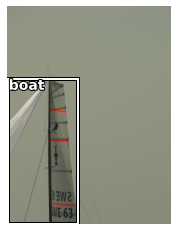

In [16]:
idx = train_id[88]
bb, c = train_lg_anno[idx]
ax = show_img(load_img(img_path/train_fn[idx]))
draw_rect(ax, bb, cats[c])

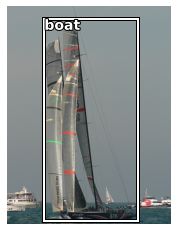

In [17]:
idx1 = test_id[88]
bb1, c1 = test_lg_anno[idx1]
ax1 = show_img(load_img(img_path1/test_fn[idx1]))
draw_rect(ax1, bb1, cats[c1])

In [18]:
class ResBlock(keras.layers.Layer):
    def __init__(self, filters, expansion, strides=1, skip=False,  activation='relu', **kwargs):
        super().__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)
        self.main_layer = []
        if expansion > 1:

            self.main_layer = [
                                Conv2D(filters, 1, strides=1, padding='same', kernel_initializer='he_normal',use_bias=False),
                                BatchNormalization(), 
                                Activation('relu'), 
                                Conv2D(filters, 3,strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False),
                                BatchNormalization(),
                                Activation('relu'), 
                                Conv2D(filters*expansion, 1, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
                                BatchNormalization(gamma_initializer='zero')

            ]
        else:
            self.main_layer = [
                                Conv2D(filters, 3, strides=strides, padding='same', use_bias=False, kernel_initializer='he_normal'),
                                BatchNormalization(),
                                Activation('relu'),
                                Conv2D(filters, 3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
                                BatchNormalization(gamma_initializer='zero')
        ]
        self.skip = []
        if strides > 1 or skip:
            self.skip = [
                            Conv2D(filters*expansion, 1, strides=strides, padding='same', use_bias=False),
                            BatchNormalization()
            ]
            
            
    def call(self, inputs):
        X = inputs
        for layer in self.main_layer:
            X = layer(X)
        skip_path = inputs
        for layer in self.skip:
            skip_path = layer(skip_path)
        return self.activation(X + skip_path)

In [19]:
images = [str(img_path/train_fn[id]) for id in train_id]
bb_label =[train_lg_anno[id][0] for id in train_id]
cls_label = [train_lg_anno[id][1]-1 for id in train_id]
for i in range(len(bb_label)):
    bb_label[i] = np.asarray(bb_label[i])
    x_scale = 224 / train_wh[train_id[i]][0]
    y_scale = 224 / train_wh[train_id[i]][1]
    bb_label[i][0], bb_label[i][2] =   bb_label[i][0] * x_scale, bb_label[i][2] * x_scale
    bb_label[i][1], bb_label[i][3] =   bb_label[i][1] * y_scale, bb_label[i][3] * y_scale

In [20]:
images1 = [str(img_path1/test_fn[id]) for id in test_id]
bb_label1 =[test_lg_anno[id][0] for id in test_id]
cls_label1 = [test_lg_anno[id][1]-1 for id in test_id]
for i in range(len(bb_label1)):
    bb_label1[i] = np.asarray(bb_label1[i])
    x_scale = 224 / test_wh[test_id[i]][0]
    y_scale = 224 / test_wh[test_id[i]][1]
    bb_label1[i][0], bb_label1[i][2] =   bb_label1[i][0] * x_scale, bb_label1[i][2] * x_scale
    bb_label1[i][1], bb_label1[i][3] =   bb_label1[i][1] * y_scale, bb_label1[i][3] * y_scale

In [21]:
dataset = tf.data.Dataset.from_tensor_slices((images, bb_label ,cls_label))
dataset = dataset.map(lambda x, bb, cls: (x, (bb, cls)))
dataset_val = tf.data.Dataset.from_tensor_slices((images1, bb_label1 ,cls_label1))
dataset_val = dataset_val.map(lambda x1, bb1, cls: (x1, (bb1, cls)))

In [22]:
dataset

<MapDataset shapes: ((), ((4,), ())), types: (tf.string, (tf.int32, tf.int32))>

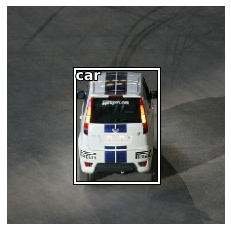

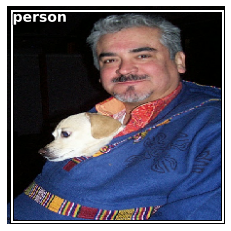

In [23]:
x, lbl = list(iter(dataset))[0]
x = tf.image.decode_jpeg(tf.io.read_file(x), channels=3)
x = tf.cast(x, dtype = tf.float32) / 255.
x = tf.image.resize(x, (224, 224), antialias=True, method='nearest')
ax = show_img(x)
draw_rect(ax, lbl[0].numpy(), cats[lbl[1].numpy()+1])

x1, lbl1 = list(iter(dataset_val))[0]
x1 = tf.image.decode_jpeg(tf.io.read_file(x1), channels=3)
x1 = tf.cast(x1, dtype = tf.float32) / 255.
x1 = tf.image.resize(x1, (224, 224), antialias=True, method='nearest')
ax1 = show_img(x1)
draw_rect(ax1, lbl1[0].numpy(), cats[lbl1[1].numpy()+1])

In [24]:
def preprocess(x, lbl):
    x = tf.image.decode_jpeg(tf.io.read_file(x), channels=3)
    x = tf.cast(x, dtype = tf.float32)
    x = tf.image.resize(x, (224, 224), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    x = x / 255.
    return x, lbl

In [25]:
dataset = dataset.map(preprocess, num_parallel_calls=-1)
list(next(dataset.as_numpy_iterator()))[1]
dataset_val = dataset_val.map(preprocess, num_parallel_calls=-1)
list(next(dataset_val.as_numpy_iterator()))[1]

(array([  4,   4, 218, 218]), 14)

In [26]:
dataset1 = dataset_val.shuffle(512).batch(64, drop_remainder=True).repeat().prefetch(32)
dataset2 = dataset_val.shuffle(512).batch(128, drop_remainder=True).repeat().prefetch(32)
dataset_val1 = dataset.batch(64, drop_remainder=True)
dataset_val2 = dataset.batch(128, drop_remainder=True)

In [27]:
def xresnet34(input_shape):
    input_ = Input(shape=input_shape)
    nfs = [32, 64, 64]
    for i, f in enumerate(nfs):
        X = Conv2D(f, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 if i==0 else 1)(input_ if i==0 else X)
        X = BatchNormalization()(X)
        X = Activation('relu')(X)


    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    prev_filters = 64
    for i, filters in enumerate([64]*3 + [128]*4 + [256]*6 + [512]*3):
        strides = 1
        if filters != prev_filters:
            strides = 2
        X = ResBlock(filters, 1, strides=strides)(X)
        prev_filters = filters
    X = Flatten()(X)
    X = Dropout(0.5)(X)
    X = Dense(256, kernel_initializer='he_normal')(X)
    X = ReLU()(X)
    X = BatchNormalization()(X)
    X = Dropout(0.5)(X)
    bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
    cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
    model = keras.models.Model(inputs=input_, outputs=[bbox_out, cls_out])
    return model
model1 = xresnet34((224, 224, 3))
model1.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 112, 112, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 112, 112, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [28]:
model1.compile(optimizer=keras.optimizers.Adam(1e-2),
              loss={'bbox_output': keras.losses.MeanAbsoluteError(),
                    'class_output':keras.losses.SparseCategoricalCrossentropy()},
              metrics=['accuracy'],
             loss_weights={'bbox_output':1, 'class_output':30})
train1 = model1.fit(dataset1, epochs = 50, steps_per_epoch=39,validation_data = dataset_val1)


Epoch 1/50
39/39 [==============================] - 15s 385ms/step - loss: 185.0746 - bbox_output_loss: 90.0849 - class_output_loss: 3.1663 - bbox_output_accuracy: 0.2780 - class_output_accuracy: 0.1695 - val_loss: 2188039.0000 - val_bbox_output_loss: 96874.3672 - val_class_output_loss: 69705.4844 - val_bbox_output_accuracy: 0.3514 - val_class_output_accuracy: 0.0966
Epoch 2/50
39/39 [==============================] - 13s 343ms/step - loss: 162.8218 - bbox_output_loss: 78.5020 - class_output_loss: 2.8107 - bbox_output_accuracy: 0.3586 - class_output_accuracy: 0.2280 - val_loss: 2437.7661 - val_bbox_output_loss: 368.2395 - val_class_output_loss: 68.9842 - val_bbox_output_accuracy: 0.4383 - val_class_output_accuracy: 0.0805
Epoch 3/50
39/39 [==============================] - 13s 329ms/step - loss: 136.6073 - bbox_output_loss: 54.3085 - class_output_loss: 2.7433 - bbox_output_accuracy: 0.4014 - class_output_accuracy: 0.2356 - val_loss: 2824.8386 - val_bbox_output_loss: 324.6377 - val_clas

In [84]:
def get_config(self):

    config = super().get_config().copy()
    config.update({
        'vocab_size': self.vocab_size,
        'num_layers': self.num_layers,
        'units': self.units,
        'd_model': self.d_model,
        'num_heads': self.num_heads,
        'dropout': self.dropout,
    })
    return config

In [95]:
model1.save('modle1')

INFO:tensorflow:Assets written to: modle1\assets


In [30]:
model1.summary()
z1 = pd.DataFrame.from_dict(train1.history, orient = 'index', columns = np.arange(50)) 
z1

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 112, 112, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 112, 112, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
loss,1.850746e+02,162.821808,136.607346,122.723198,117.528633,111.878883,110.862907,103.867661,104.565376,99.470428,...,33.186321,32.346046,32.063591,31.016371,30.918619,29.575546,29.891415,30.605326,29.902905,29.395103
bbox_output_loss,9.008491e+01,78.501953,54.308537,43.498669,43.067642,41.110313,41.934349,39.805447,40.957317,39.401218,...,28.004097,27.122290,27.191071,26.930902,26.646156,25.799011,25.659216,25.888781,25.550472,25.708822
class_output_loss,3.166322e+00,2.810661,2.743293,2.640818,2.482034,2.358953,2.297619,2.135406,2.120269,2.002307,...,0.172741,0.174125,0.162417,0.136182,0.142416,0.125884,0.141073,0.157218,0.145081,0.122876
bbox_output_accuracy,2.780449e-01,0.358574,0.401442,0.423878,0.443109,0.462340,0.477965,0.492388,0.501202,0.493990,...,0.643429,0.655449,0.667067,0.632612,0.669471,0.676282,0.663061,0.669471,0.675881,0.671875
class_output_accuracy,1.694712e-01,0.227965,0.235577,0.235978,0.259215,0.301282,0.311699,0.345353,0.343349,0.377003,...,0.943910,0.939904,0.948317,0.956731,0.952724,0.957532,0.955529,0.946314,0.948718,0.959135
val_loss,2.188039e+06,2437.766113,2824.838623,150.703949,127.118080,113.866310,117.093002,123.054726,115.760666,122.340759,...,155.480713,173.899292,166.404510,167.528381,169.298294,157.745453,185.854248,156.198029,174.338196,176.542450
val_bbox_output_loss,9.687437e+04,368.239502,324.637665,42.716728,43.113220,41.393738,41.020359,40.255882,39.387993,40.622520,...,36.386299,38.641113,37.214619,37.039494,37.598419,38.528027,37.820934,37.304008,37.141514,36.739540
val_class_output_loss,6.970548e+04,68.984207,83.339996,3.599573,2.800162,2.415753,2.535755,2.759962,2.545757,2.723942,...,3.969813,4.508606,4.306330,4.349630,4.389995,3.973915,4.934445,3.963134,4.573222,4.660096
val_bbox_output_accuracy,3.513622e-01,0.438301,0.340144,0.448718,0.478766,0.507212,0.483974,0.466747,0.501202,0.473958,...,0.542067,0.533654,0.532853,0.528846,0.545673,0.524840,0.533253,0.544872,0.530849,0.549679
val_class_output_accuracy,9.655449e-02,0.080529,0.038462,0.228766,0.277244,0.280048,0.298077,0.254407,0.295272,0.310897,...,0.376603,0.347356,0.348157,0.334535,0.343750,0.340946,0.364583,0.374199,0.362179,0.346955


In [31]:
# model4.compile(optimizer=keras.optimizers.Adam(1e-2),
#               loss={'bbox_output': keras.losses.MeanAbsoluteError(),
#                     'class_output':keras.losses.SparseCategoricalCrossentropy()},
#               metrics=['accuracy'],
#              loss_weights={'bbox_output':1, 'class_output':30})
# #带残差的网络出的结果
# train44 = model4.fit(dataset1, epochs = 50, steps_per_epoch=39,validation_data = dataset_val1)
# model4.save('modle4.h5')

In [36]:
def net2(input_shape): #去除resnet的简单网络
    input_ = Input(shape=input_shape)
    nfs = [32, 64, 64]
    for i, f in enumerate(nfs):
        X = Conv2D(f, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 if i==0 else 1)(input_ if i==0 else X)
        X = BatchNormalization()(X)
        X = Activation('relu')(X)


    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    prev_filters = 64

    X = Flatten()(X)
    X = Dropout(0.5)(X)
    X = Dense(256, kernel_initializer='he_normal')(X)
    X = ReLU()(X)
    X = BatchNormalization()(X)
    X = Dropout(0.5)(X)
    bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
    cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
    model = keras.models.Model(inputs=input_, outputs=[bbox_out, cls_out])
    return model

model2 = net2((224,224,3))
model2.compile(optimizer=keras.optimizers.Adam(1e-2),
              loss={'bbox_output': keras.losses.MeanAbsoluteError(),
                    'class_output':keras.losses.SparseCategoricalCrossentropy()},
              metrics=['accuracy'],
             loss_weights={'bbox_output':1, 'class_output':30})
train2 = model2.fit(dataset1, epochs = 50, steps_per_epoch=39,validation_data = dataset_val1)

# 不带残差的网络



Epoch 1/50
39/39 [==============================] - 6s 149ms/step - loss: 184.9289 - bbox_output_loss: 89.8858 - class_output_loss: 3.1681 - bbox_output_accuracy: 0.2965 - class_output_accuracy: 0.1619 - val_loss: 645.2347 - val_bbox_output_loss: 93.9164 - val_class_output_loss: 18.3773 - val_bbox_output_accuracy: 0.1350 - val_class_output_accuracy: 0.1751
Epoch 2/50
39/39 [==============================] - 6s 142ms/step - loss: 157.9529 - bbox_output_loss: 76.8869 - class_output_loss: 2.7022 - bbox_output_accuracy: 0.3690 - class_output_accuracy: 0.2224 - val_loss: 189.0855 - val_bbox_output_loss: 64.4596 - val_class_output_loss: 4.1542 - val_bbox_output_accuracy: 0.3273 - val_class_output_accuracy: 0.1550
Epoch 3/50
39/39 [==============================] - 5s 140ms/step - loss: 131.2147 - bbox_output_loss: 52.8499 - class_output_loss: 2.6122 - bbox_output_accuracy: 0.4163 - class_output_accuracy: 0.2364 - val_loss: 151.2956 - val_bbox_output_loss: 43.8331 - val_class_output_loss: 3.5

In [96]:
model2.save('model2')

INFO:tensorflow:Assets written to: model2\assets


In [41]:
model2.summary()
z2 = pd.DataFrame.from_dict(train2.history, orient = 'index', columns = np.arange(50)) 
z2

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 112, 112, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_43 (BatchNo (None, 112, 112, 32) 128         conv2d_41[0][0]                  
__________________________________________________________________________________________________
activation_22 (Activation)      (None, 112, 112, 32) 0           batch_normalization_43[0][0]     
____________________________________________________________________________________________

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
loss,184.928925,157.952881,131.214722,120.174217,115.127441,111.267052,109.057419,104.765015,99.705894,96.766441,...,32.219421,31.221781,33.465961,31.268951,30.326836,29.747799,29.941084,30.303524,29.188648,29.278238
bbox_output_loss,89.885826,76.886948,52.849911,42.737518,42.842705,41.676838,42.122734,41.038422,40.929783,40.063763,...,27.703379,27.093412,27.824711,27.230263,26.770185,26.276590,26.390684,26.123446,25.885452,25.591274
class_output_loss,3.168103,2.702198,2.612160,2.581223,2.409491,2.319673,2.231156,2.124220,1.959203,1.890090,...,0.150535,0.137612,0.188041,0.134623,0.118555,0.115707,0.118347,0.139336,0.110107,0.122899
bbox_output_accuracy,0.296474,0.368990,0.416266,0.418670,0.431891,0.438702,0.446314,0.473558,0.489183,0.500401,...,0.651843,0.653045,0.651442,0.643830,0.657452,0.660657,0.679487,0.668670,0.685497,0.673878
class_output_accuracy,0.161859,0.222356,0.236378,0.240785,0.284054,0.307692,0.310897,0.360577,0.400240,0.415865,...,0.949920,0.954327,0.935897,0.955529,0.963542,0.962740,0.963942,0.953926,0.960737,0.960337
val_loss,645.234680,189.085464,151.295578,126.084259,121.215485,118.415001,117.395271,119.925552,123.537788,141.955902,...,201.437912,197.074646,218.150284,202.604736,202.560181,214.847580,180.973145,198.718796,182.731094,199.728180
val_bbox_output_loss,93.916428,64.459625,43.833099,42.287849,42.080364,41.389282,41.940308,40.908802,41.097527,43.601196,...,45.886288,39.379269,41.696762,40.079899,42.824543,39.684460,39.950253,39.264355,41.600506,38.533447
val_class_output_loss,18.377272,4.154195,3.582083,2.793215,2.637837,2.567524,2.515165,2.633893,2.748009,3.278491,...,5.185053,5.256513,5.881784,5.417494,5.324521,5.838772,4.700763,5.315148,4.704351,5.373158
val_bbox_output_accuracy,0.135016,0.327324,0.439503,0.439503,0.442708,0.467147,0.483974,0.490785,0.502804,0.510016,...,0.530048,0.522837,0.525641,0.528846,0.520833,0.531250,0.523237,0.529247,0.530048,0.538462
val_class_output_accuracy,0.175080,0.155048,0.177083,0.206330,0.250000,0.283654,0.292468,0.261218,0.314904,0.218750,...,0.283253,0.306090,0.320913,0.335337,0.310497,0.330128,0.313301,0.334135,0.302484,0.322917


In [42]:
from keras.layers.core import Dense,Activation,Dropout
from keras.models import Sequential,Model

In [43]:
def alexnet(input_shape):
    input_ = Input(shape=input_shape)

    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(input_)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X )
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Flatten()(X)
    X = Dropout(0.5)(X)
    X = Dense(256, kernel_initializer='he_normal')(X)
    X = ReLU()(X)
    X = BatchNormalization()(X)
    X = Dropout(0.5)(X)

    bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
    cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
    model3 = keras.models.Model(inputs=input_, outputs=[bbox_out, cls_out])
    return model3
#alexnet
model3 = alexnet((224,224,3))
model3.compile(optimizer=keras.optimizers.Adam(1e-2),
              loss={'bbox_output': keras.losses.MeanAbsoluteError(),
                    'class_output':keras.losses.SparseCategoricalCrossentropy()},
              metrics=['accuracy'],
             loss_weights={'bbox_output':1, 'class_output':30})
train3 = model3.fit(dataset1, epochs = 100, steps_per_epoch=39,validation_data = dataset_val1)


Epoch 1/100
39/39 [==============================] - 4s 112ms/step - loss: 192.1018 - bbox_output_loss: 90.3060 - class_output_loss: 3.3932 - bbox_output_accuracy: 0.2764 - class_output_accuracy: 0.1502 - val_loss: 551.6771 - val_bbox_output_loss: 89.3814 - val_class_output_loss: 15.4099 - val_bbox_output_accuracy: 0.1370 - val_class_output_accuracy: 0.0393
Epoch 2/100
39/39 [==============================] - 4s 98ms/step - loss: 157.2895 - bbox_output_loss: 77.0777 - class_output_loss: 2.6737 - bbox_output_accuracy: 0.3462 - class_output_accuracy: 0.2063 - val_loss: 188.0062 - val_bbox_output_loss: 61.4186 - val_class_output_loss: 4.2196 - val_bbox_output_accuracy: 0.3754 - val_class_output_accuracy: 0.2143
Epoch 3/100
39/39 [==============================] - 3s 89ms/step - loss: 128.6354 - bbox_output_loss: 52.6579 - class_output_loss: 2.5326 - bbox_output_accuracy: 0.3866 - class_output_accuracy: 0.2444 - val_loss: 123.6055 - val_bbox_output_loss: 42.4782 - val_class_output_loss: 2.

In [97]:
model3.save('model3')

INFO:tensorflow:Assets written to: model3\assets


In [87]:
model3.summary()
z3 = pd.DataFrame.from_dict(train3.history, orient = 'index', columns = np.arange(100)) 
z3

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 112, 112, 32) 864         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_47 (BatchNo (None, 112, 112, 32) 128         conv2d_44[0][0]                  
__________________________________________________________________________________________________
activation_25 (Activation)      (None, 112, 112, 32) 0           batch_normalization_47[0][0]     
____________________________________________________________________________________________

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
loss,192.101807,157.289536,128.635376,118.815277,115.976540,113.924065,112.038422,109.890411,108.924820,108.521271,...,74.653267,75.293854,73.899712,73.568878,74.174995,73.097862,74.140854,74.048012,75.707146,75.340584
bbox_output_loss,90.306030,77.077744,52.657871,42.864525,42.606194,41.441864,41.460945,40.851898,41.205097,40.440838,...,35.180622,35.134670,34.812939,34.846294,34.794086,34.664558,34.605404,35.363945,34.857265,35.164700
class_output_loss,3.393192,2.673726,2.532583,2.531692,2.445678,2.416073,2.352582,2.301284,2.257324,2.269348,...,1.315755,1.338639,1.302893,1.290753,1.312696,1.281110,1.317848,1.289469,1.361663,1.339196
bbox_output_accuracy,0.276442,0.346154,0.386619,0.434295,0.454327,0.466747,0.495192,0.477564,0.508413,0.491186,...,0.561699,0.550881,0.547676,0.571715,0.561298,0.550080,0.544872,0.553686,0.541266,0.545272
class_output_accuracy,0.150240,0.206330,0.244391,0.243590,0.268429,0.268029,0.288862,0.300881,0.317708,0.313702,...,0.560096,0.556891,0.566506,0.574920,0.556490,0.569311,0.570913,0.578125,0.559696,0.569311
val_loss,551.677063,188.006180,123.605492,134.948410,123.398277,130.051331,127.356285,145.129913,116.468262,113.198830,...,114.949669,110.515816,99.601387,110.829063,104.379944,104.131355,124.295296,108.084419,117.964409,102.583809
val_bbox_output_loss,89.381371,61.418625,42.478210,43.095379,41.607262,41.199627,43.403175,46.307014,41.421337,39.841061,...,40.327385,40.970688,36.516674,35.916565,36.601746,36.237362,40.648800,36.731236,43.417439,37.357342
val_class_output_loss,15.409856,4.219584,2.704244,3.061768,2.726368,2.961723,2.798437,3.294096,2.501565,2.445259,...,2.487409,2.318171,2.102824,2.497083,2.259274,2.263134,2.788216,2.378439,2.484898,2.174216
val_bbox_output_accuracy,0.137019,0.375401,0.440705,0.439503,0.468349,0.439103,0.445513,0.443109,0.508013,0.500801,...,0.533253,0.530048,0.536458,0.544071,0.549279,0.538862,0.527644,0.545673,0.530849,0.551282
val_class_output_accuracy,0.039263,0.214343,0.238782,0.225962,0.264423,0.179087,0.251603,0.238782,0.247596,0.288462,...,0.398638,0.344952,0.399840,0.360577,0.387019,0.375401,0.366587,0.358974,0.388622,0.395433


In [45]:
# def net_with_pooling(input_shape):
#     input_ = Input(shape=input_shape)

#     X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(input_ )
#     X = BatchNormalization()(X)
#     X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
#     X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X )
#     X = BatchNormalization()(X)
#     X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
#     X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X)
#     X = BatchNormalization()(X)
#     X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
#     X = Flatten()(X)
#     X = Dropout(0.5)(X)
#     X = Dense(256, kernel_initializer='he_normal')(X)
#     X = ReLU()(X)
#     X = BatchNormalization()(X)
#     X = Dropout(0.5)(X)

#     bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
#     cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
#     model3 = keras.models.Model(inputs = input_, outputs = [bbox_out,cls_out])
#     return model3

# model4 = net_with_pooling((224,224,3))
# model4.compile(
#     optimizer = 'rmsprop', #adam,SGD
#     loss={'bbox_output': keras.losses.MeanAbsoluteError(),
#                     'class_output':keras.losses.SparseCategoricalCrossentropy()},
#               metrics=['accuracy'],
#              loss_weights={'bbox_output':1, 'class_output':1000})
# train4 = model4.fit(dataset1, epochs = 50, steps_per_epoch=39,validation_data = dataset_val1)

In [46]:
# torch.save(model4,'model4.pkl')
# joblib.dump(filename = 'model4',value = nodel4)
# model4.state_dict()
# state = {'net':model4.state_dict(),'optimizer':optimizer.state_dict(),'epoch':epoch}

In [47]:
# z4 =  pd.DataFrame.from_dict(train4.history, orient = 'index', columns = np.arange(50)) #训练结果匹配 这里columns改承
# z44 = np.transpose(z4)
# xxx = np.arange(50)
# # z4['loss'].plot( figsize=(14,6), legend=False, kind = 'barh')
# plt.plot(xxx,z44['loss'])
# plt.plot(xxx,z44['class_output_sparse_categorical_accuracy'])

In [48]:
def net_without_pooling(input_shape):
    input_ = Input(shape=input_shape)

    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(input_ )
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X )
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
#     X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Flatten()(X)
    X = Dropout(0.5)(X)
    X = Dense(256, kernel_initializer='he_normal')(X)
    X = ReLU()(X)
    X = BatchNormalization()(X)
    X = Dropout(0.5)(X)

    bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
    cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
    model3 = keras.models.Model(inputs = input_, outputs = [bbox_out,cls_out])
    return model3

model5 = net_without_pooling((224,224,3))
model5.compile(
    optimizer = 'rmsprop', #adam,SGD
    loss={'bbox_output': keras.losses.MeanAbsoluteError(),
                    'class_output':keras.losses.SparseCategoricalCrossentropy()},
              metrics=['accuracy'],
             loss_weights={'bbox_output':1, 'class_output':30})
train5 = model5.fit(dataset1, epochs = 100, steps_per_epoch=39,validation_data = dataset_val1)


Epoch 1/100
39/39 [==============================] - 4s 112ms/step - loss: 193.4710 - bbox_output_loss: 92.0376 - class_output_loss: 3.3811 - bbox_output_accuracy: 0.2468 - class_output_accuracy: 0.1438 - val_loss: 231.4117 - val_bbox_output_loss: 89.9218 - val_class_output_loss: 4.7163 - val_bbox_output_accuracy: 0.3377 - val_class_output_accuracy: 0.1038
Epoch 2/100
39/39 [==============================] - 4s 98ms/step - loss: 179.2958 - bbox_output_loss: 92.0932 - class_output_loss: 2.9068 - bbox_output_accuracy: 0.2352 - class_output_accuracy: 0.1927 - val_loss: 173.6333 - val_bbox_output_loss: 90.6552 - val_class_output_loss: 2.7659 - val_bbox_output_accuracy: 0.3746 - val_class_output_accuracy: 0.2332
Epoch 3/100
39/39 [==============================] - 3s 84ms/step - loss: 158.1107 - bbox_output_loss: 91.4931 - class_output_loss: 2.2206 - bbox_output_accuracy: 0.2520 - class_output_accuracy: 0.3586 - val_loss: 173.8274 - val_bbox_output_loss: 90.9394 - val_class_output_loss: 2.7

In [98]:
model5.save('model5')

INFO:tensorflow:Assets written to: model5\assets


In [50]:
model5.summary()
z5 = pd.DataFrame.from_dict(train5.history, orient = 'index', columns = np.arange(100)) 
z5

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_47 (Conv2D)              (None, 112, 112, 32) 864         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_51 (BatchNo (None, 112, 112, 32) 128         conv2d_47[0][0]                  
__________________________________________________________________________________________________
activation_28 (Activation)      (None, 112, 112, 32) 0           batch_normalization_51[0][0]     
____________________________________________________________________________________________

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
loss,193.470978,179.295807,158.110687,152.347198,130.817627,129.200592,112.762596,114.682266,105.240959,102.775475,...,28.852329,28.185078,28.503653,28.087954,28.587179,28.234219,27.986952,27.384380,27.264107,27.628080
bbox_output_loss,92.037575,92.093239,91.493080,91.008156,90.195740,89.618065,88.765816,87.883530,86.279358,84.722359,...,25.772905,25.356815,25.289209,25.504374,25.781466,25.318623,25.061398,24.890688,24.959980,24.997305
class_output_loss,3.381114,2.906752,2.220587,2.044634,1.354063,1.319418,0.799893,0.893292,0.632053,0.601770,...,0.102648,0.094275,0.107148,0.086119,0.093524,0.097186,0.097519,0.083123,0.076804,0.087692
bbox_output_accuracy,0.246795,0.235176,0.252003,0.258814,0.300080,0.292468,0.311699,0.294872,0.312099,0.322115,...,0.680288,0.677484,0.665865,0.677885,0.680288,0.669471,0.676683,0.688702,0.684295,0.674279
class_output_accuracy,0.143830,0.192708,0.358574,0.393029,0.594551,0.602564,0.760817,0.726763,0.807292,0.815304,...,0.961939,0.969151,0.964343,0.970753,0.973157,0.967949,0.965946,0.973157,0.970753,0.972356
val_loss,231.411682,173.633270,173.827393,174.831955,181.469849,184.098663,190.459610,179.084625,181.442291,170.816956,...,182.829620,170.499634,192.081589,192.255920,178.845383,190.559113,167.076630,175.790298,168.108490,188.631866
val_bbox_output_loss,89.921783,90.655197,90.939430,90.356812,89.938599,88.804047,87.422470,85.517670,84.588852,81.950035,...,40.877232,39.481819,39.976555,40.167267,40.099487,41.664322,40.143242,40.016830,40.068108,40.304283
val_class_output_loss,4.716329,2.765935,2.762932,2.815839,3.051041,3.176487,3.434571,3.118898,3.228449,2.962231,...,4.731746,4.367260,5.070168,5.069622,4.624865,4.963160,4.231113,4.525782,4.268013,4.944254
val_bbox_output_accuracy,0.337740,0.374599,0.373798,0.409856,0.328526,0.338542,0.387420,0.326122,0.341747,0.344952,...,0.487981,0.504006,0.500000,0.498798,0.483574,0.498798,0.504407,0.502003,0.500801,0.504407
val_class_output_accuracy,0.103766,0.233173,0.203526,0.199119,0.217949,0.210337,0.200321,0.244391,0.225160,0.286458,...,0.310497,0.306090,0.297276,0.296875,0.304487,0.302484,0.312099,0.305689,0.302484,0.313301


In [51]:
def net_with_bigger_batch(input_shape):
    input_ = Input(shape=input_shape)

    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(input_ )
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X )
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Conv2D(32, 3, padding='same', kernel_initializer='he_normal', use_bias=False, strides=2 )(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=2, padding='same')(X)
    X = Flatten()(X)
    X = Dropout(0.5)(X)
    X = Dense(256, kernel_initializer='he_normal')(X)
    X = ReLU()(X)
    X = BatchNormalization()(X)
    X = Dropout(0.5)(X)

    bbox_out = Dense(4, kernel_initializer='he_normal', name='bbox_output')(X)
    cls_out = Dense(20, kernel_initializer='he_normal',  activation='softmax',name='class_output')(X)
    model3 = keras.models.Model(inputs = input_, outputs = [bbox_out,cls_out])
    return model3

model6 = net_with_bigger_batch((224,224,3))
model6.compile(
    optimizer = 'rmsprop', #adam,SGD
      loss={'bbox_output': keras.losses.MeanAbsoluteError(),
                    'class_output':keras.losses.SparseCategoricalCrossentropy()},
              metrics=['accuracy'],
             loss_weights={'bbox_output':1, 'class_output':30})
train6 = model6.fit(dataset2, epochs = 100, steps_per_epoch=39,validation_data = dataset_val2)


Epoch 1/100
39/39 [==============================] - 6s 163ms/step - loss: 208.0353 - bbox_output_loss: 92.2341 - class_output_loss: 3.8600 - bbox_output_accuracy: 0.2502 - class_output_accuracy: 0.1056 - val_loss: 170.9818 - val_bbox_output_loss: 91.5965 - val_class_output_loss: 2.6462 - val_bbox_output_accuracy: 0.1994 - val_class_output_accuracy: 0.2331
Epoch 2/100
39/39 [==============================] - 5s 129ms/step - loss: 191.2832 - bbox_output_loss: 92.0350 - class_output_loss: 3.3083 - bbox_output_accuracy: 0.2522 - class_output_accuracy: 0.1643 - val_loss: 170.7048 - val_bbox_output_loss: 91.3696 - val_class_output_loss: 2.6445 - val_bbox_output_accuracy: 0.2426 - val_class_output_accuracy: 0.2516
Epoch 3/100
39/39 [==============================] - 5s 141ms/step - loss: 181.2380 - bbox_output_loss: 91.6750 - class_output_loss: 2.9854 - bbox_output_accuracy: 0.2710 - class_output_accuracy: 0.1965 - val_loss: 171.6265 - val_bbox_output_loss: 91.0126 - val_class_output_loss: 2

In [99]:
model6.save('model6')

INFO:tensorflow:Assets written to: model6\assets


In [52]:
model6.summary()
z6 = pd.DataFrame.from_dict(train6.history, orient = 'index', columns = np.arange(100)) 
z6

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_50 (Conv2D)              (None, 112, 112, 32) 864         input_6[0][0]                    
__________________________________________________________________________________________________
batch_normalization_55 (BatchNo (None, 112, 112, 32) 128         conv2d_50[0][0]                  
__________________________________________________________________________________________________
activation_31 (Activation)      (None, 112, 112, 32) 0           batch_normalization_55[0][0]     
____________________________________________________________________________________________

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
loss,208.035263,191.283188,181.237961,175.349228,169.595139,164.981476,160.832123,157.084015,153.202606,149.094345,...,64.960159,64.897270,64.687119,64.292839,64.040001,63.979874,64.030197,62.994247,62.700653,62.324921
bbox_output_loss,92.234146,92.034988,91.674973,91.033005,90.409096,89.340454,88.327156,86.717163,85.086426,82.892860,...,35.887589,35.679005,35.560295,35.637707,35.685421,35.499016,35.596512,35.423210,35.452396,35.120354
class_output_loss,3.860038,3.308274,2.985433,2.810541,2.639534,2.521366,2.416832,2.345563,2.270540,2.206716,...,0.969086,0.973942,0.970894,0.955171,0.945152,0.949362,0.947790,0.919034,0.908275,0.906819
bbox_output_accuracy,0.250200,0.252204,0.271034,0.279447,0.293870,0.309095,0.316506,0.326522,0.339944,0.336138,...,0.548878,0.553085,0.553285,0.555088,0.548478,0.551883,0.562901,0.559896,0.552885,0.555489
class_output_accuracy,0.105569,0.164263,0.196514,0.236178,0.249199,0.264223,0.282051,0.298277,0.316506,0.330329,...,0.670473,0.673878,0.671474,0.679688,0.690104,0.678285,0.681891,0.689503,0.693910,0.692708
val_loss,170.981796,170.704819,171.626511,174.763519,167.806152,176.137085,165.677216,162.730270,157.496994,156.860580,...,107.710388,103.568703,108.960205,108.168365,125.996658,113.376610,124.022690,111.434891,113.874100,112.578857
val_bbox_output_loss,91.596542,91.369637,91.012604,90.474693,89.618729,88.901291,88.202827,87.228065,83.755592,80.533554,...,36.890728,37.411259,37.414581,36.597576,41.474178,37.368835,41.290173,36.354179,36.397148,37.628963
val_class_output_loss,2.646174,2.644506,2.687131,2.809628,2.606248,2.907860,2.582480,2.516740,2.458047,2.544234,...,2.360655,2.205248,2.384854,2.385693,2.817416,2.533592,2.757751,2.502690,2.582565,2.498330
val_bbox_output_accuracy,0.199424,0.242599,0.284539,0.347451,0.363487,0.351562,0.348684,0.388569,0.389391,0.373355,...,0.536595,0.546875,0.546053,0.539474,0.525905,0.543997,0.531250,0.548520,0.540707,0.548520
val_class_output_accuracy,0.233141,0.251645,0.245888,0.246711,0.266447,0.250411,0.286184,0.277961,0.302220,0.292763,...,0.375822,0.386513,0.391036,0.395970,0.405428,0.409128,0.395148,0.376645,0.368421,0.390214


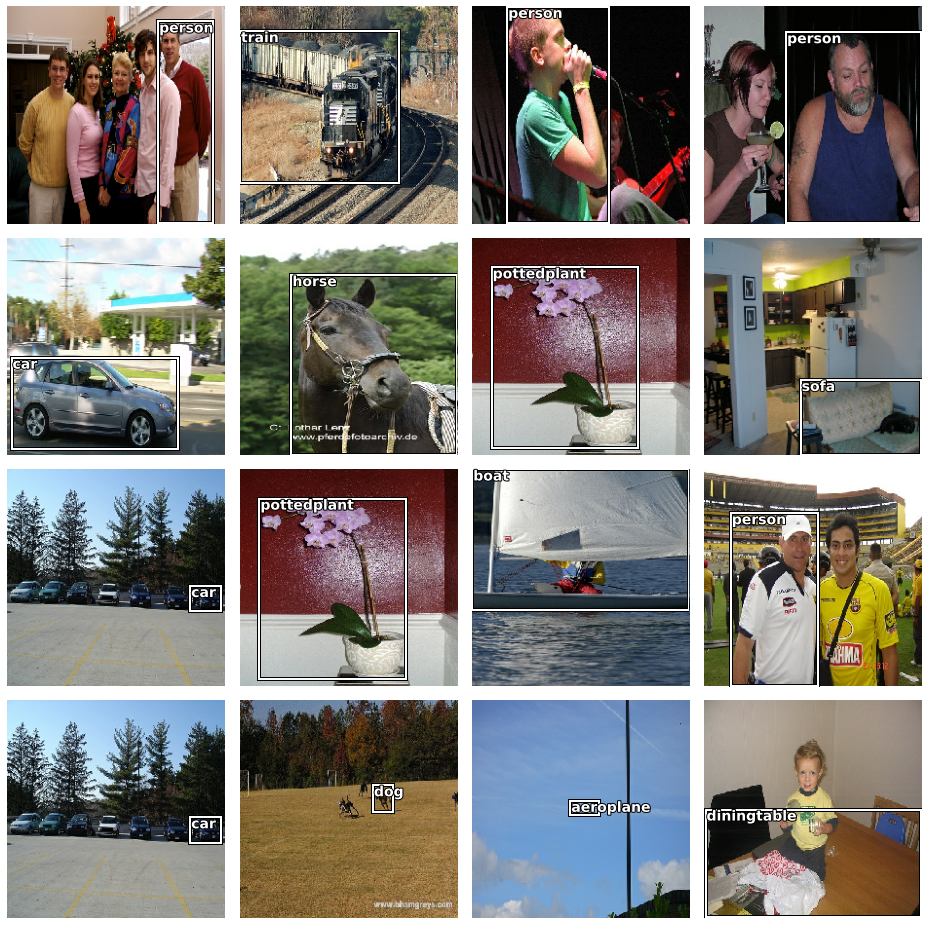

In [53]:
# 预测
x, y = next(iter(dataset1))
idx = np.random.randint(0, 64, 16)
fig, axs = plt.subplots(4, 4, figsize=(13, 13))
imgs = x.numpy()[idx]
bbs = y[0].numpy()[idx]
cls = y[1].numpy()[idx]
for i, ax in enumerate(axs.flat):
    show_img(imgs[i], ax)
    draw_rect(ax, bbs[i], cats[cls[i] + 1])  
plt.tight_layout()


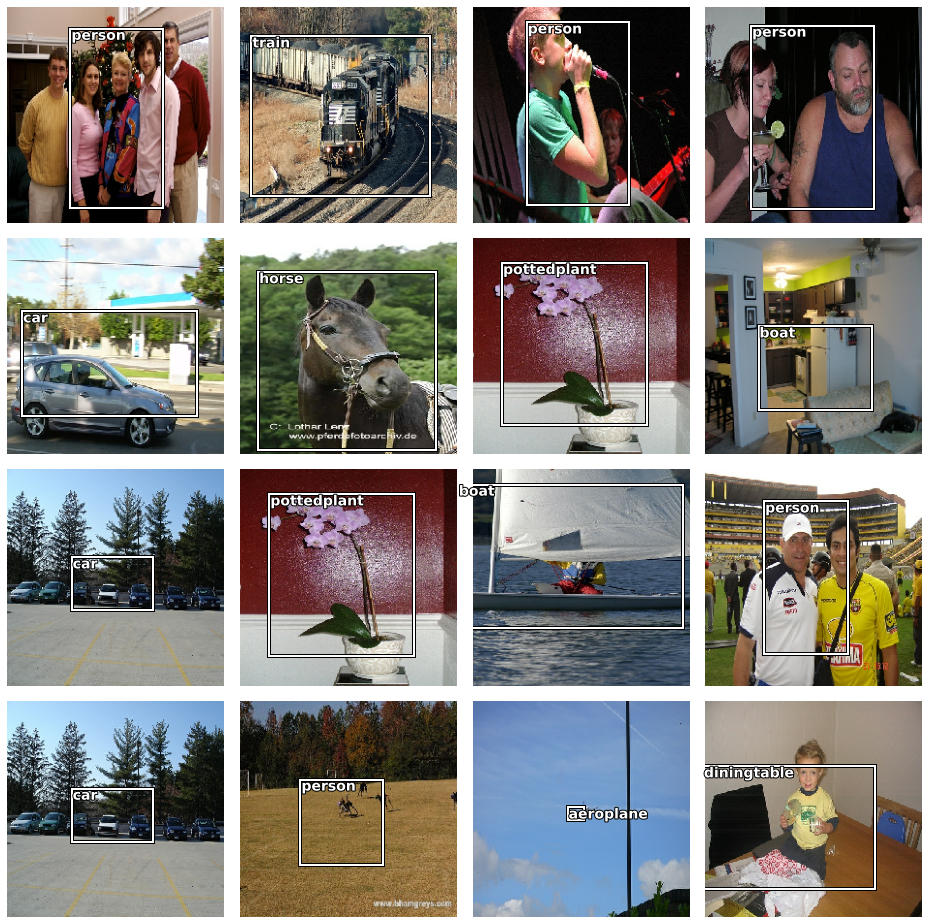

In [54]:
pred = model1.predict(imgs)
c = pred[1].argmax(axis = 1) + 1
fig, axs = plt.subplots(4, 4, figsize=(13, 13))
for i, ax in enumerate(axs.flat):
    show_img(imgs[i], ax)
    draw_rect(ax, pred[0][i], cats[c[i]])
plt.tight_layout()

In [55]:
# 计算RoI
def CountIOU(RecA, RecB):
    xA = max(RecA[0], RecB[0])
    yA = max(RecA[1], RecB[1])
    xB = min(RecA[2], RecB[2])
    yB = min(RecA[3], RecB[3])
    # 计算交集部分面积
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # 计算预测值和真实值的面积
    RecA_Area = (RecA[2] - RecA[0] + 1) * (RecA[3] - RecA[1] + 1)
    RecB_Area = (RecB[2] - RecB[0] + 1) * (RecB[3] - RecB[1] + 1)
    # 计算IOU
    iou = interArea / float(RecA_Area + RecB_Area - interArea)
    return iou



In [56]:
a = []
for i in np.arange(16):
    a.append(CountIOU(bbs[i],pred[0][i]))

a


[-0.0,
 0.7492952181976549,
 0.557666340055042,
 0.4433882286268986,
 0.0,
 0.6933354913273694,
 0.7876856202879295,
 -0.0,
 0.0,
 0.7876856202879295,
 0.7875981458494407,
 0.3510981038758408,
 0.0,
 0.0,
 0.0,
 0.0]

In [57]:
#利用不同的优化器
# model.compile(
#     loss={'bbox_output': keras.losses.MeanAbsoluteError(),
#                     'class_output':keras.losses.SparseCategoricalCrossentropy()},
#     optimizer = 'rmsprop', #adam,SGD
#     metrics = ['accuracy'],)
# model.fit(dataset, epochs=20, steps_per_epoch=39) 

(10, 16, 9)


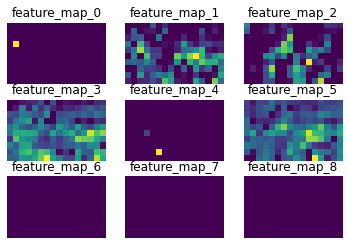

ipykernel_launcher:35: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


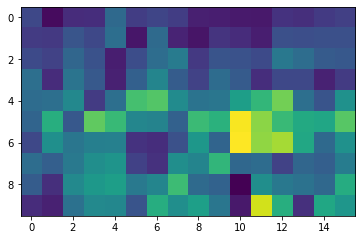

In [59]:
#过程的可视化
 


 
def get_row_col(num_pic):
    squr = num_pic ** 0.5
    row = round(squr)
    col = row + 1 if squr - row > 0 else row
    return row, col

 
def visualize_feature_map(img_batch):
    feature_map = np.squeeze(img_batch, axis=0)
    print(feature_map.shape)
 
    feature_map_combination = []
    plt.figure()
 
    num_pic = feature_map.shape[2]
    row, col = get_row_col(num_pic)
 
    for i in range(0, num_pic):
        feature_map_split = feature_map[:, :, i]
        feature_map_combination.append(feature_map_split)
        plt.subplot(row, col, i + 1)
        plt.imshow(feature_map_split)
        axis('off')
        title('feature_map_{}'.format(i))
 
    plt.savefig('feature_map.png')
    plt.show()
 
    # 各个特征图按1：1 叠加
    feature_map_sum = sum(ele for ele in feature_map_combination)
    plt.imshow(feature_map_sum)
    plt.savefig("feature_map_sum.png")
 
 
def create_model():
    model = Sequential()
 
    # 第一层CNN
    # 第一个参数是卷积核的数量，第二三个参数是卷积核的大小
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(4, 4)))

    # 第二层CNN
    model.add(Convolution2D(9, 5 ,input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(3, 3)))
 
    # 第三层CNN
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
 
    # 第四层CNN
    model.add(Convolution2D(9, 3, input_shape=img.shape))
    model.add(Activation('relu'))
    # model.add(MaxPooling2D(pool_size=(2, 2)))
 
    return model
 

if __name__ == "__main__":
    img = cv2.imread('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')
#     img = cv2.imread('001.jpg')
 
    model = create_model()

    img_batch = np.expand_dims(img, axis=0)
    conv_img = model.predict(img_batch)  # conv_img 卷积结果
 
    visualize_feature_map(conv_img)
#显示跑了第一层后过程的结果 ，想得到第二层CNN需要把第二层的 # 去掉

In [100]:
# from skimage import io

# img = io.imread('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')

# io.imshow(img)

In [77]:
img.shape

(375, 500, 3)

(92, 124, 9)


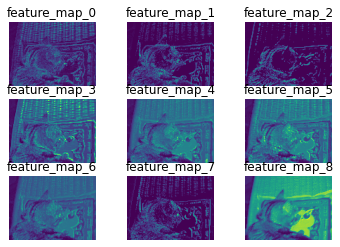

ipykernel_launcher:35: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


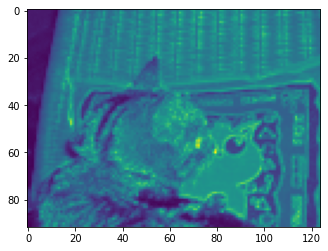

In [66]:

def create_model():
    model = Sequential()
 
    # 第一层CNN
    # 第一个参数是卷积核的数量，第二三个参数是卷积核的大小
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(4, 4)))

#     # 第二层CNN
#     model.add(Convolution2D(9, 5 ,input_shape=img.shape))
#     model.add(Activation('relu'))
#     model.add(MaxPooling2D(pool_size=(3, 3)))
 
#     # 第三层CNN
#     model.add(Convolution2D(9, 5, input_shape=img.shape))
#     model.add(Activation('relu'))
#     model.add(MaxPooling2D(pool_size=(2, 2)))
 
#     # 第四层CNN
#     model.add(Convolution2D(9, 3, input_shape=img.shape))
#     model.add(Activation('relu'))
#     # model.add(MaxPooling2D(pool_size=(2, 2)))
 
    return model
 

if __name__ == "__main__":
    img = cv2.imread('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')
#     img = cv2.imread('001.jpg')
 
    model = create_model()

    img_batch = np.expand_dims(img, axis=0)
    conv_img = model.predict(img_batch)  # conv_img 卷积结果
 
    visualize_feature_map(conv_img)
#显示跑了第一层后过程的结果 ，想得到第二层CNN需要把第二层的 # 去掉

(29, 40, 9)


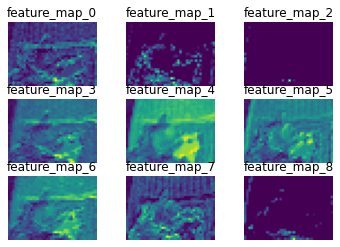

ipykernel_launcher:35: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


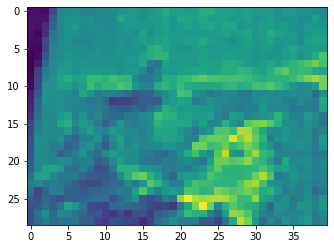

In [67]:
def create_model():
    model = Sequential()
 
    # 第一层CNN
    # 第一个参数是卷积核的数量，第二三个参数是卷积核的大小
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(4, 4)))

    # 第二层CNN
    model.add(Convolution2D(9, 5 ,input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(3, 3)))
 
#     # 第三层CNN
#     model.add(Convolution2D(9, 5, input_shape=img.shape))
#     model.add(Activation('relu'))
#     model.add(MaxPooling2D(pool_size=(2, 2)))
 
#     # 第四层CNN
#     model.add(Convolution2D(9, 3, input_shape=img.shape))
#     model.add(Activation('relu'))
#     # model.add(MaxPooling2D(pool_size=(2, 2)))
 
    return model
 

if __name__ == "__main__":
    img = cv2.imread('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')
#     img = cv2.imread('001.jpg')
 
    model = create_model()

    img_batch = np.expand_dims(img, axis=0)
    conv_img = model.predict(img_batch)  # conv_img 卷积结果
 
    visualize_feature_map(conv_img)
#显示跑了第一层后过程的结果 ，想得到第二层CNN需要把第二层的 # 去掉

(12, 18, 9)


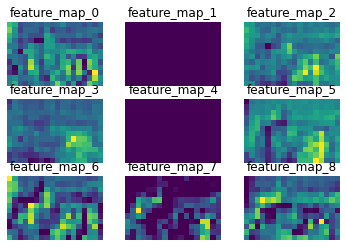

ipykernel_launcher:35: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


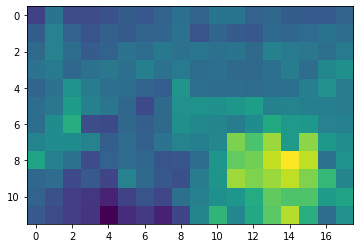

In [68]:
def create_model():
    model = Sequential()
 
    # 第一层CNN
    # 第一个参数是卷积核的数量，第二三个参数是卷积核的大小
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(4, 4)))

    # 第二层CNN
    model.add(Convolution2D(9, 5 ,input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(3, 3)))
 
    # 第三层CNN
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

#     # 第四层CNN
#     model.add(Convolution2D(9, 3, input_shape=img.shape))
#     model.add(Activation('relu'))
#     # model.add(MaxPooling2D(pool_size=(2, 2)))
 
    return model
 

if __name__ == "__main__":
    img = cv2.imread('VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')
#     img = cv2.imread('001.jpg')
 
    model = create_model()

    img_batch = np.expand_dims(img, axis=0)
    conv_img = model.predict(img_batch)  # conv_img 卷积结果
 
    visualize_feature_map(conv_img)
#显示跑了第一层后过程的结果 ，想得到第二层CNN需要把第二层的 # 去掉

(10, 16, 16)


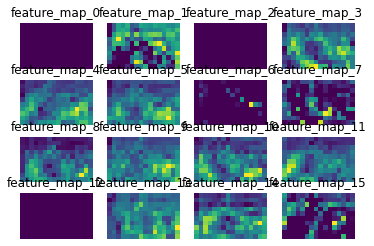

<ipython-input-5-c809a8137671>:42: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  feature_map_sum = sum(ele for ele in feature_map_combination)


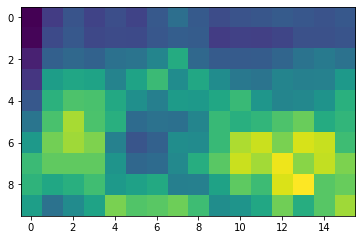

In [56]:
def create_model():
    model = Sequential()
 
    # 第一层CNN
    # 第一个参数是卷积核的数量，第二三个参数是卷积核的大小
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(4, 4)))

    # 第二层CNN
    model.add(Convolution2D(9, 5 ,input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(3, 3)))
 
    # 第三层CNN
    model.add(Convolution2D(9, 5, input_shape=img.shape))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
 
    # 第四层CNN
    model.add(Convolution2D(16, 3, input_shape=img.shape))
    model.add(Activation('relu'))
    # model.add(MaxPooling2D(pool_size=(2, 2)))
 
    return model
 

if __name__ == "__main__":
    img = cv2.imread('e:/pyworkspace/kaggle/input/archive/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/000209.jpg')
#     img = cv2.imread('001.jpg')
 
    model = create_model()

    img_batch = np.expand_dims(img, axis=0)
    conv_img = model.predict(img_batch)  # conv_img 卷积结果
 
    visualize_feature_map(conv_img)
#显示跑了第一层后过程的结果 ，想得到第二层CNN需要把第二层的 # 去掉

In [69]:
z1

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
loss,1.850746e+02,162.821808,136.607346,122.723198,117.528633,111.878883,110.862907,103.867661,104.565376,99.470428,...,33.186321,32.346046,32.063591,31.016371,30.918619,29.575546,29.891415,30.605326,29.902905,29.395103
bbox_output_loss,9.008491e+01,78.501953,54.308537,43.498669,43.067642,41.110313,41.934349,39.805447,40.957317,39.401218,...,28.004097,27.122290,27.191071,26.930902,26.646156,25.799011,25.659216,25.888781,25.550472,25.708822
class_output_loss,3.166322e+00,2.810661,2.743293,2.640818,2.482034,2.358953,2.297619,2.135406,2.120269,2.002307,...,0.172741,0.174125,0.162417,0.136182,0.142416,0.125884,0.141073,0.157218,0.145081,0.122876
bbox_output_accuracy,2.780449e-01,0.358574,0.401442,0.423878,0.443109,0.462340,0.477965,0.492388,0.501202,0.493990,...,0.643429,0.655449,0.667067,0.632612,0.669471,0.676282,0.663061,0.669471,0.675881,0.671875
class_output_accuracy,1.694712e-01,0.227965,0.235577,0.235978,0.259215,0.301282,0.311699,0.345353,0.343349,0.377003,...,0.943910,0.939904,0.948317,0.956731,0.952724,0.957532,0.955529,0.946314,0.948718,0.959135
val_loss,2.188039e+06,2437.766113,2824.838623,150.703949,127.118080,113.866310,117.093002,123.054726,115.760666,122.340759,...,155.480713,173.899292,166.404510,167.528381,169.298294,157.745453,185.854248,156.198029,174.338196,176.542450
val_bbox_output_loss,9.687437e+04,368.239502,324.637665,42.716728,43.113220,41.393738,41.020359,40.255882,39.387993,40.622520,...,36.386299,38.641113,37.214619,37.039494,37.598419,38.528027,37.820934,37.304008,37.141514,36.739540
val_class_output_loss,6.970548e+04,68.984207,83.339996,3.599573,2.800162,2.415753,2.535755,2.759962,2.545757,2.723942,...,3.969813,4.508606,4.306330,4.349630,4.389995,3.973915,4.934445,3.963134,4.573222,4.660096
val_bbox_output_accuracy,3.513622e-01,0.438301,0.340144,0.448718,0.478766,0.507212,0.483974,0.466747,0.501202,0.473958,...,0.542067,0.533654,0.532853,0.528846,0.545673,0.524840,0.533253,0.544872,0.530849,0.549679
val_class_output_accuracy,9.655449e-02,0.080529,0.038462,0.228766,0.277244,0.280048,0.298077,0.254407,0.295272,0.310897,...,0.376603,0.347356,0.348157,0.334535,0.343750,0.340946,0.364583,0.374199,0.362179,0.346955


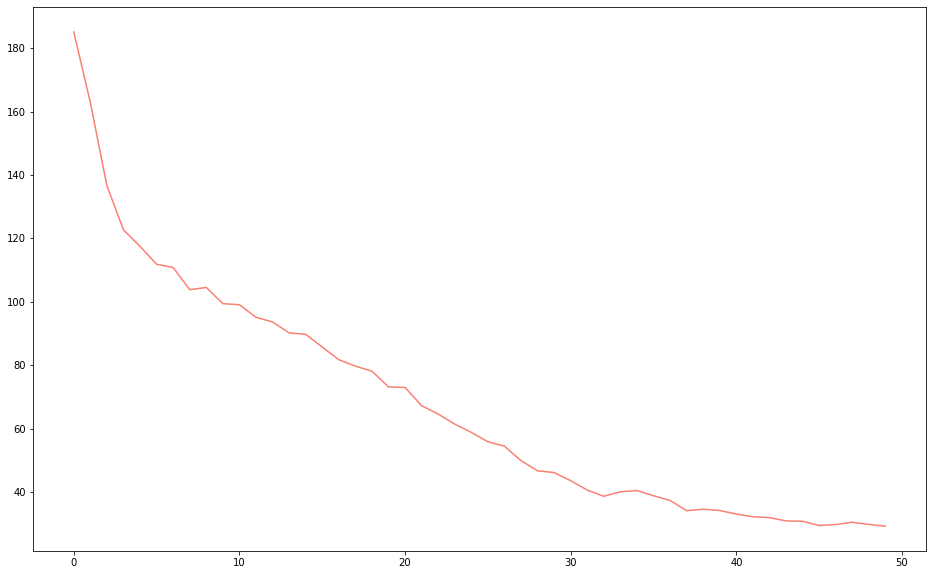

In [77]:
plt.figure(figsize = (16,10))
plt.plot(z1.T.loss, c ='salmon')

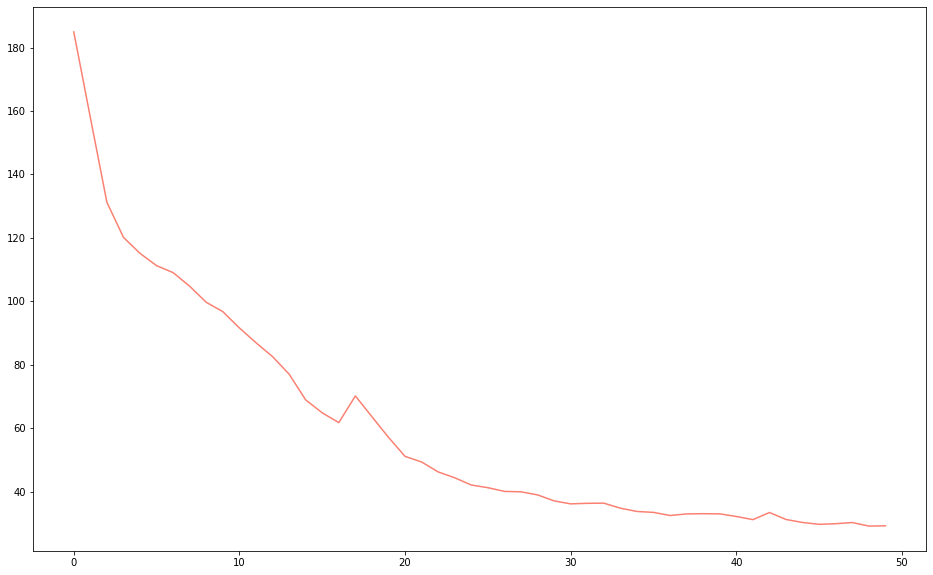

In [72]:
plt.figure(figsize = (16,10))
plt.plot(z2.T.loss, c ='salmon')

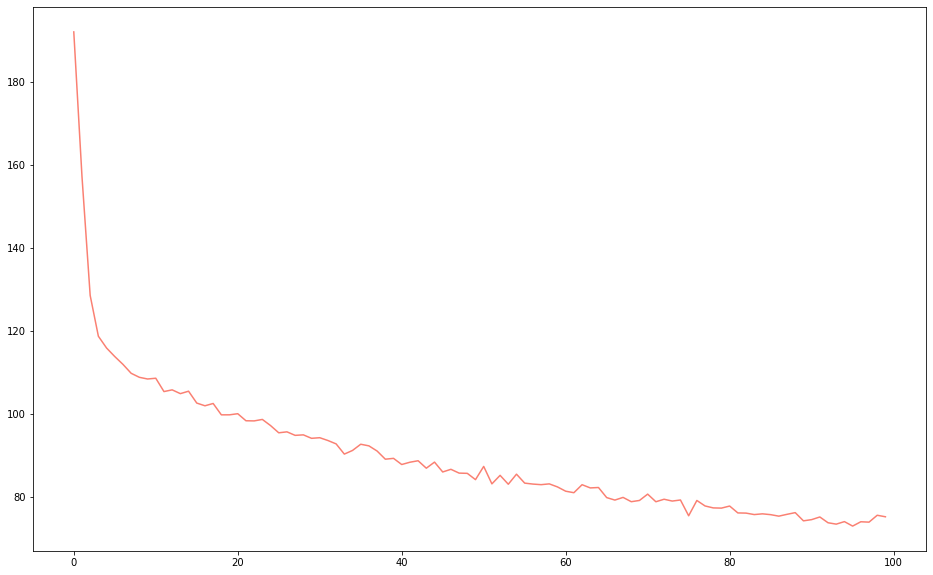

In [73]:
plt.figure(figsize = (16,10))
plt.plot(z3.T.loss, c ='salmon')

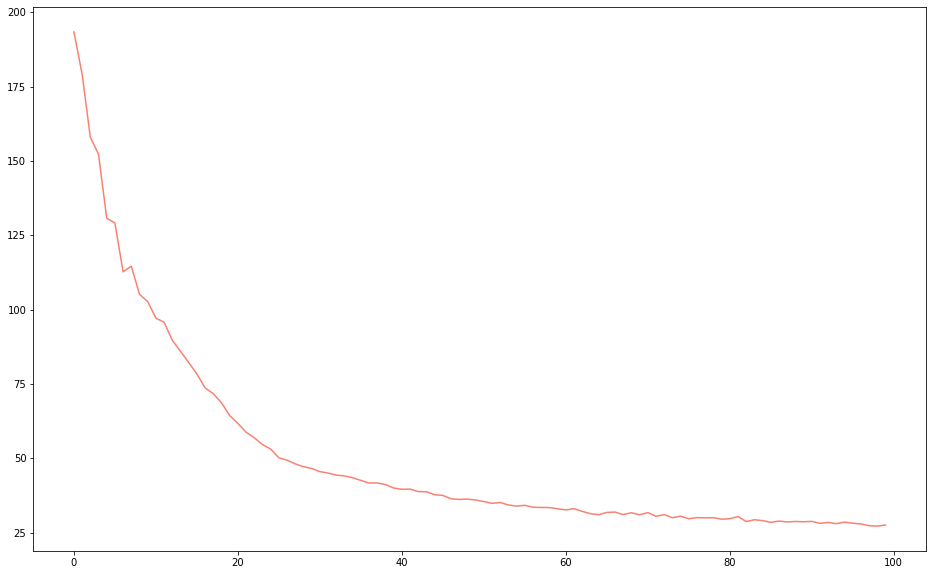

In [75]:
plt.figure(figsize = (16,10))
plt.plot(z5.T.loss, c ='salmon')

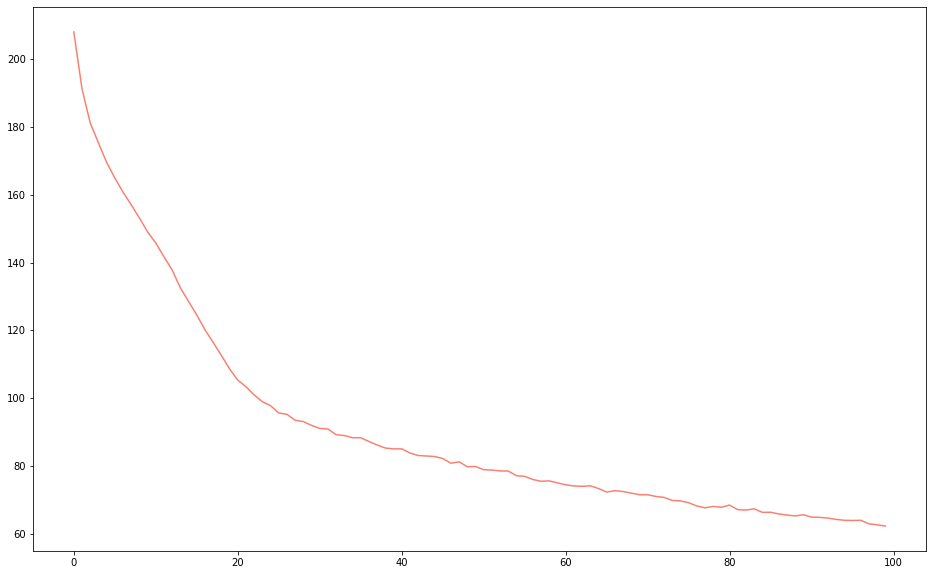

In [76]:
plt.figure(figsize = (16,10))
plt.plot(z6.T.loss, c ='salmon')

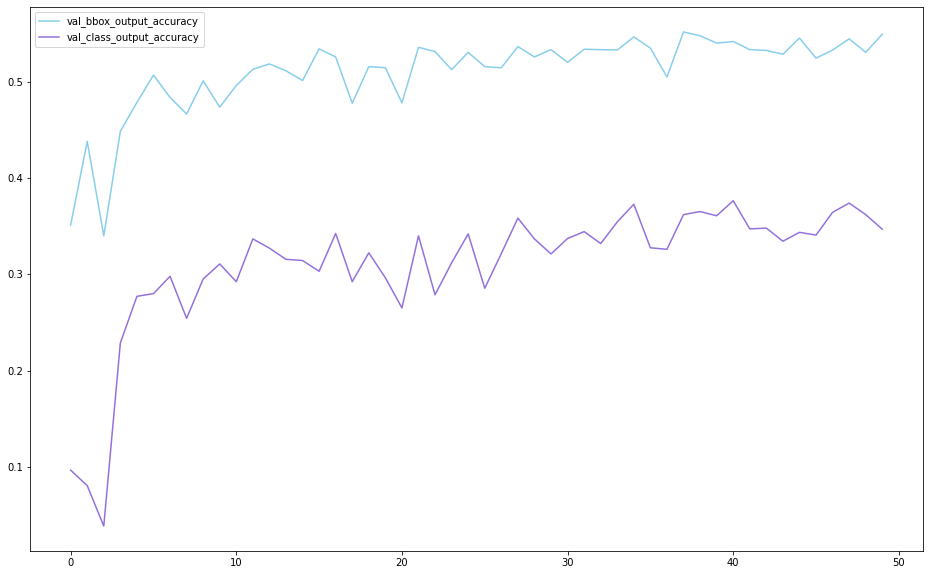

In [103]:
plt.figure(figsize = (16,10))
plt.plot(z1.T.val_bbox_output_accuracy, c ='skyblue', label ='val_bbox_output_accuracy')
plt.plot(z1.T.val_class_output_accuracy, c ='mediumpurple',label ='val_class_output_accuracy')
plt.legend()


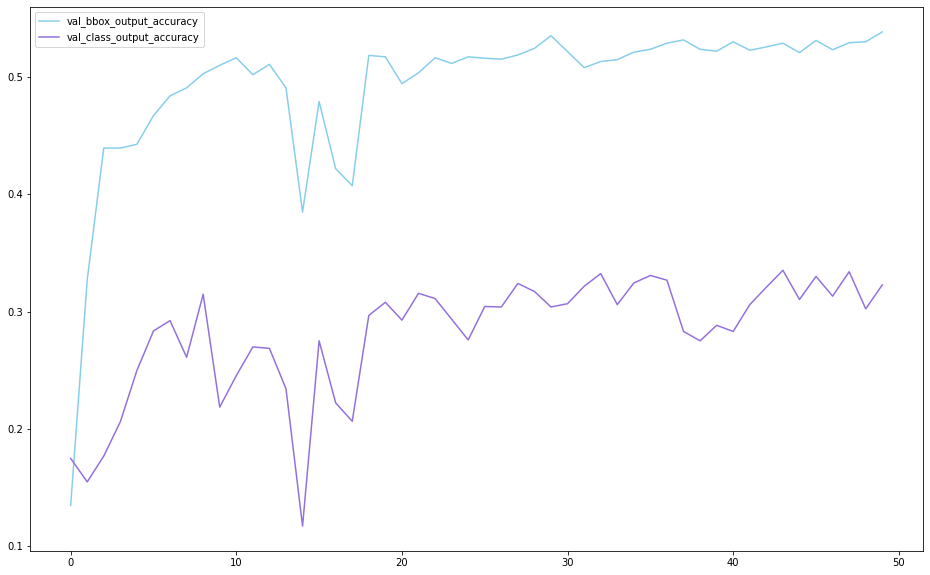

In [105]:
plt.figure(figsize = (16,10))
plt.plot(z2.T.val_bbox_output_accuracy, c ='skyblue', label ='val_bbox_output_accuracy')
plt.plot(z2.T.val_class_output_accuracy, c ='mediumpurple',label ='val_class_output_accuracy')
plt.legend()

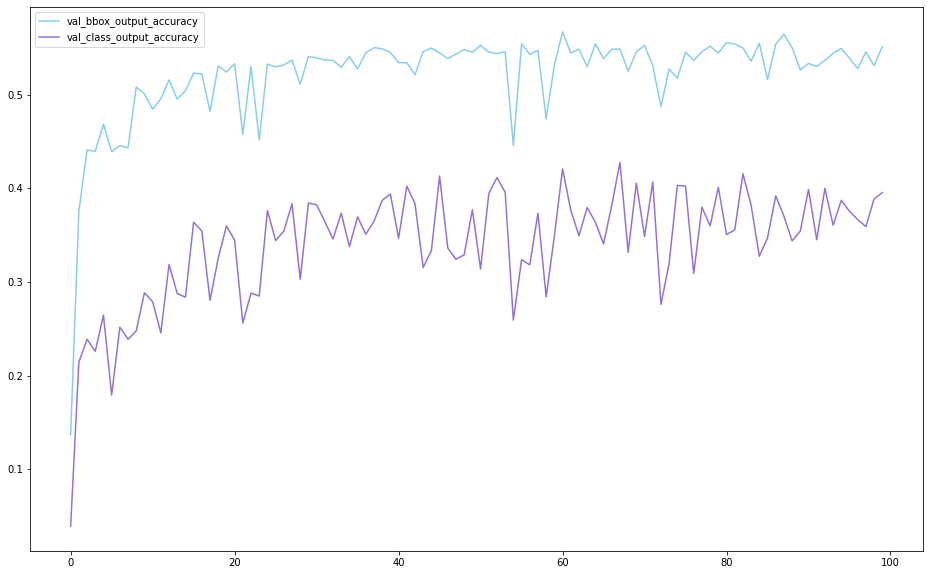

In [106]:
plt.figure(figsize = (16,10))
plt.plot(z3.T.val_bbox_output_accuracy, c ='skyblue', label ='val_bbox_output_accuracy')
plt.plot(z3.T.val_class_output_accuracy, c ='mediumpurple',label ='val_class_output_accuracy')
plt.legend()

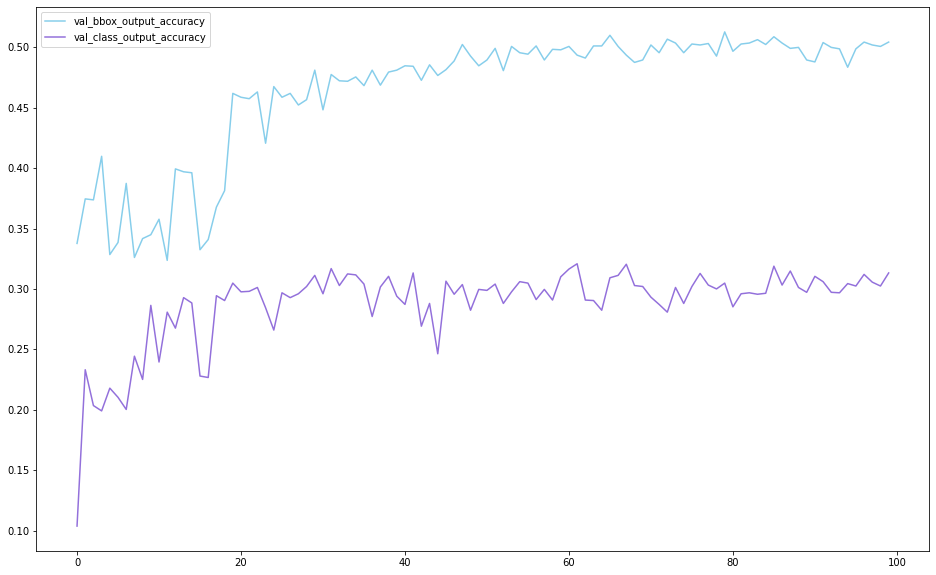

In [107]:
plt.figure(figsize = (16,10))
plt.plot(z5.T.val_bbox_output_accuracy, c ='skyblue', label ='val_bbox_output_accuracy')
plt.plot(z5.T.val_class_output_accuracy, c ='mediumpurple',label ='val_class_output_accuracy')
plt.legend()

<Figure size 1152x720 with 0 Axes>

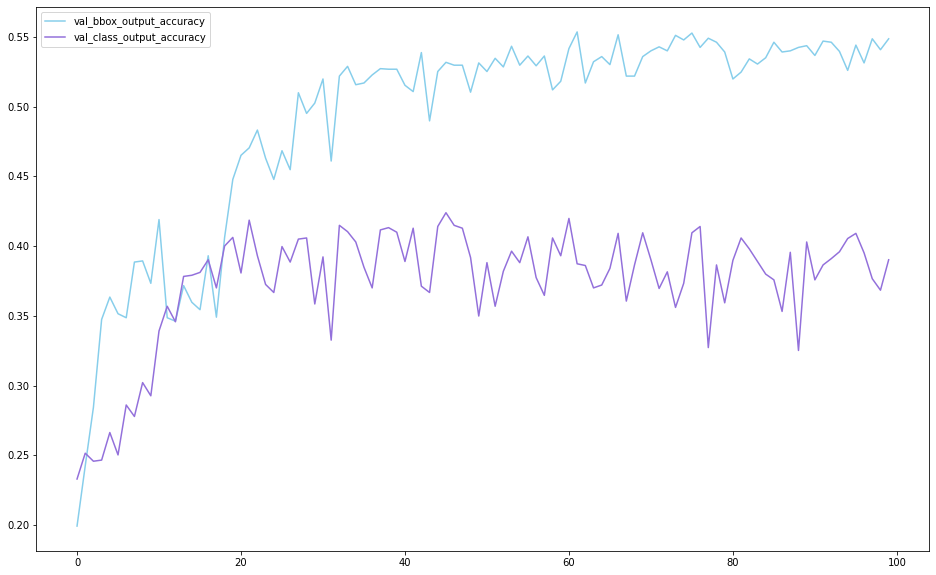

In [108]:
plt.figure(figsize = (16,10))
plt.figure(figsize = (16,10))
plt.plot(z6.T.val_bbox_output_accuracy, c ='skyblue', label ='val_bbox_output_accuracy')
plt.plot(z6.T.val_class_output_accuracy, c ='mediumpurple',label ='val_class_output_accuracy')
plt.legend()